# RCNN Pytorch Demo

Object detection is a computer vision task where given an image we have to find objects positions and classify detected objects into different categories.

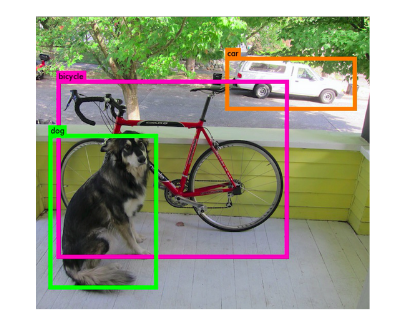

Reference: https://pjreddie.com/darknet/yolov1/

In object detection we are trying to solve two tasks:
- Object localisation
- Classification

<!--
![obj_detection_chart.png](attachment:obj_detection_chart.png) -->

## Installing and Importing dependencies

In [ ]:
# kaggle for loading preprocessed dataset
!pip install -q kaggle

In [ ]:
# mounting google drive for loading kaggle api .json file
from google.colab import drive

drive.mount("/content/drive")

In [ ]:
import torch
import cv2
import pickle
import os
import numpy as np
import pandas as pd
import torch.nn as nn
import torch.optim as optim
import torchvision
import matplotlib.pyplot as plt
from tqdm import tqdm

## Loading and Exploring data

We will be using Pascal VOC dataset 2007 version. It provides standardised image data sets for object class recognition. More information about dataset can be accesed at this [url](http://host.robots.ox.ac.uk/pascal/VOC/). We will be using `torchvision.datasets.VOCDetection` to load the dataset.

### Loading dataset

In [ ]:
# loading detection data
voc_dataset_train = torchvision.datasets.VOCDetection(root="content/voc",
                                                image_set="train",
                                                download=True,
                                                year="2007")
voc_dataset_val = torchvision.datasets.VOCDetection(root="content/voc",
                                                image_set="val",
                                                download=True,
                                                year="2007")

100%|██████████| 460032000/460032000 [00:14<00:00, 31429061.40it/s]


Extracting content/voc/VOCtrainval_06-Nov-2007.tar to content/voc
Using downloaded and verified file: content/voc/VOCtrainval_06-Nov-2007.tar
Extracting content/voc/VOCtrainval_06-Nov-2007.tar to content/voc


### Exploring Data

In [ ]:
voc_dataset_train[0]

(<PIL.Image.Image image mode=RGB size=500x333>,
 {'annotation': {'folder': 'VOC2007',
   'filename': '000012.jpg',
   'source': {'database': 'The VOC2007 Database',
    'annotation': 'PASCAL VOC2007',
    'image': 'flickr',
    'flickrid': '207539885'},
   'owner': {'flickrid': 'KevBow', 'name': '?'},
   'size': {'width': '500', 'height': '333', 'depth': '3'},
   'segmented': '0',
   'object': [{'name': 'car',
     'pose': 'Rear',
     'truncated': '0',
     'difficult': '0',
     'bndbox': {'xmin': '156', 'ymin': '97', 'xmax': '351', 'ymax': '270'}}]}})

Each sample in dataset is a tuple with two elements (index 0: image, index 1: annotations)
We will be only using object annotation information which is list of dictionary that contain information about object class and its bounding box.

In [ ]:
print("Sample Image shape: ", np.array(voc_dataset_train[0][0]).shape)

Sample Image shape:  (333, 500, 3)


Image shapes in pascal dataset are not uniform it contains images of different sizes.

Next we will find all unique object classes present in the dataset.

In [ ]:
all_objs = []
for ds in voc_dataset_train:
    obj_annots = ds[1]["annotation"]["object"]
    for obj in obj_annots:
        all_objs.append(obj["name"])

unique_class_labels = set(all_objs)
print("Number of unique objects in dataset: ", len(unique_class_labels))
print("Unique labels in dataset: \n", unique_class_labels)

Number of unique objects in dataset:  20
Unique labels in dataset: 
 {'diningtable', 'pottedplant', 'train', 'cat', 'cow', 'tvmonitor', 'bottle', 'bicycle', 'motorbike', 'aeroplane', 'bus', 'car', 'sofa', 'chair', 'sheep', 'bird', 'boat', 'person', 'horse', 'dog'}


Next we will create two dictionaries one will map class labels into integer and another maps integer into class labels.

In [ ]:
label_2_idx = {'pottedplant': 1, 'person': 2,
               'motorbike': 3, 'train': 4,
               'dog': 5, 'diningtable': 6,
               'horse': 7, 'bus': 8,
               'aeroplane': 9, 'sofa': 10,
               'sheep': 11, 'tvmonitor': 12,
               'bird': 13, 'bottle': 14,
               'chair': 15, 'cat': 16,
               'bicycle': 17, 'cow': 18,
               'boat': 19, 'car': 20, 'bg': 0}
idx_2_label = {1: 'pottedplant', 2: 'person',
               3: 'motorbike', 4: 'train',
               5: 'dog', 6: 'diningtable',
               7: 'horse', 8: 'bus',
               9: 'aeroplane', 10: 'sofa',
               11: 'sheep', 12: 'tvmonitor',
               13: 'bird', 14: 'bottle',
               15: 'chair', 16: 'cat',
               17: 'bicycle', 18: 'cow',
               19: 'boat', 20: 'car', 0: 'bg'}

In [ ]:
# img: image as np array
# boxes: [[xmin, y_min, x_max, y_max]]
# labels: labels present in bounding boxes
# scores: array of probabilities that given object is present in bounding boxes.
# class_map: dictionary that maps index to class names
def draw_boxes(img, boxes, scores, labels, class_map=None):
    nums = len(boxes)
    for i in range(nums):
        x1y1 = tuple((np.array(boxes[i][0:2])).astype(np.int32))
        x2y2 = tuple((np.array(boxes[i][2:4])).astype(np.int32))
        img = cv2.rectangle(img, x1y1, x2y2, (255, 0, 0), 2)
        label = int(labels[i])
        if class_map is not None:
            label_txt = class_map[label]
        else:
            label_txt = str(label)
        img = cv2.putText(
            img,
            "{} {:.4f}".format(label_txt, scores[i]),
            x1y1,
            cv2.FONT_HERSHEY_COMPLEX_SMALL,
            1,
            (0, 0, 255),
            2,
        )
    return img

we will plot one image along with true bounding boxes using `draw_boxes` function.

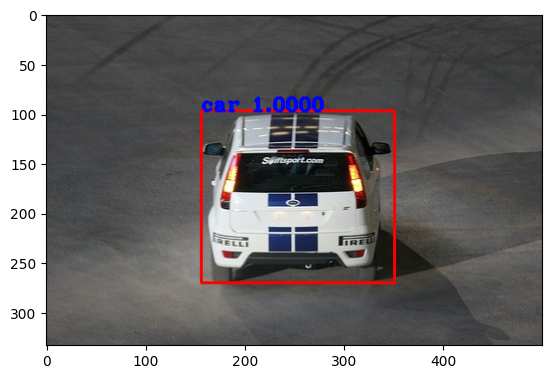

In [ ]:
sample_image, sample_annot = voc_dataset_train[0]
sample_image = np.array(sample_image)
sample_annot = sample_annot["annotation"]["object"]
boxes = [[int(v) for k, v in x["bndbox"].items()] for x in sample_annot]
labels = [label_2_idx[x["name"]] for x in sample_annot]
scores = [1]*len(labels)
final_image = draw_boxes(sample_image, boxes, scores, labels, idx_2_label)
plt.imshow(final_image)
plt.show()

We have defined `calculate_iou_score` that takes two bounding boxes as parameters and calculate intersection over union (iou) score between those boxes.

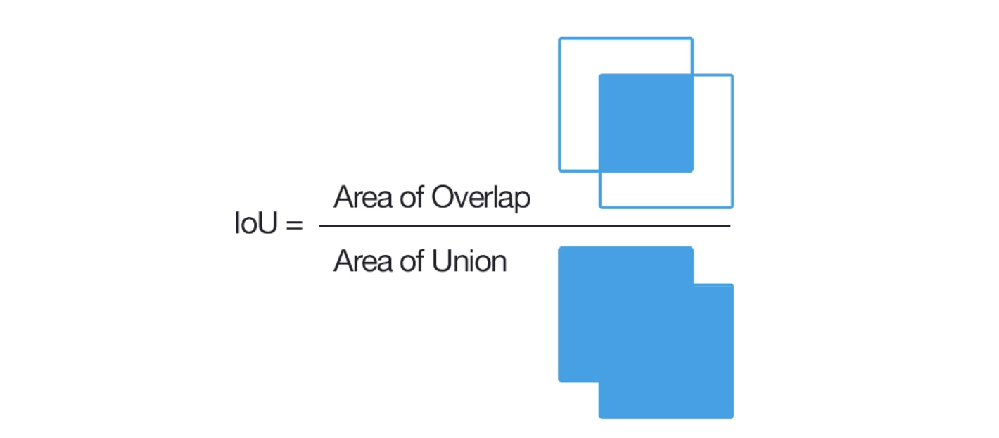

Reference: https://en.wikipedia.org/wiki/Jaccard_index

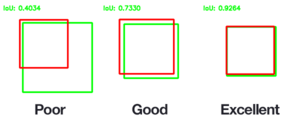

Reference: https://en.wikipedia.org/wiki/Jaccard_index

In [ ]:
def calculate_iou_score(box_1, box_2):
    '''
        box_1 = single of ground truth bounding boxes
        box_2 = single of predicted bounded boxes
    '''
    box_1_x1 = box_1[0]
    box_1_y1 = box_1[1]
    box_1_x2 = box_1[2]
    box_1_y2 = box_1[3]

    box_2_x1 = box_2[0]
    box_2_y1 = box_2[1]
    box_2_x2 = box_2[2]
    box_2_y2 = box_2[3]

    x1 = np.maximum(box_1_x1, box_2_x1)
    y1 = np.maximum(box_1_y1, box_2_y1)
    x2 = np.minimum(box_1_x2, box_2_x2)
    y2 = np.minimum(box_1_y2, box_2_y2)

    area_of_intersection = max(0, x2 - x1 + 1) * max(0, y2 - y1 + 1)
    area_box_1 = (box_1_x2 - box_1_x1 + 1) * (box_1_y2 - box_1_y1 + 1)
    area_box_2 = (box_2_x2 - box_2_x1 + 1) * (box_2_y2 - box_2_y1 + 1)
    area_of_union = area_box_1 + area_box_2 - area_of_intersection

    return area_of_intersection/float(area_of_union)

## RCNN

Paper Link: https://arxiv.org/pdf/1311.2524.pdf

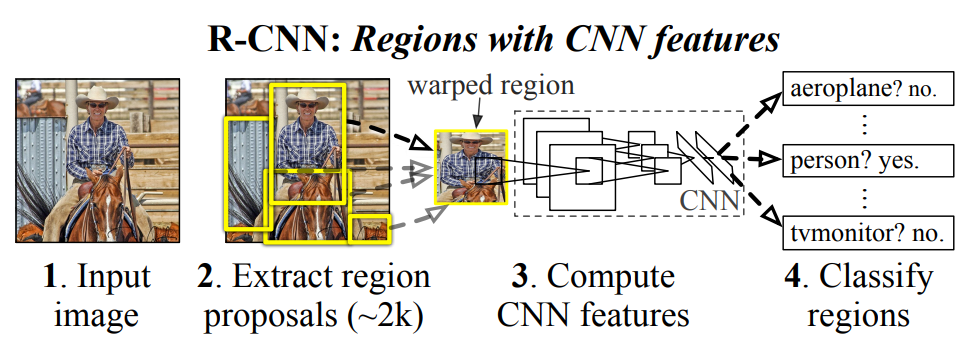

RCNN uses selective search algorithm for generating region proposals by merging
similar pixels into regions. The regions got from this step were warped, resized and preprocessed then passed into a CNN which produces feature vectors these feature vectors are then
used for classification and bounding box regression which result bounding boxes of objects and
their classes. RCNN yields a significant performance boost on VOC07 dataset, with a large
improvement of mean Average Precision (mAP) from 33.7% in DPM-v5 to 58.5%.This
algorithm was fast with respect to sliding window approach and then passing each window to
CNN but it was still quite slow to be used in realtime object detection.

#### Steps to Train RCNN
- We apply selective search algorithm to find box proposals
- We take those boxes in the dataset whose iou_score(proposed_box, true_box) > threshold.
- We also save some boxes with no objects and label them 0 (background). These will be useful while training classifier.
- We then train a CNN based model in the prepared dataset.

#### Steps for inference with RCNN
- We first apply selective search algorithm to image
- Pass all proposed bounding boxes to trained CNN model we get using above step.
- Postprocessing outputs from model (this include selecting best boxes and applying non max supression we will look these later)

#### Creating dataset for training

In [ ]:
def process_data_for_rcnn(image, rects, class_map, boxes_annots, iou_threshold, max_boxes):
    true_classes = []
    image_sections = []
    true_count = 0
    false_count = 0
    for annot in boxes_annots:
        label = annot["name"]
        box = [int(c) for _, c in annot["bndbox"].items()]
        box = np.array(box)
        for rect in rects:
            iou_score = calculate_iou_score(rect, box)
            if iou_score > iou_threshold:
                if true_count < max_boxes//2:
                    true_classes.append(class_map[label])
                    x1, y1, x2, y2 = rect
                    img_section = image[y1: y2, x1: x2]
                    image_sections.append(img_section)
                    true_count += 1
            else:
                if false_count < max_boxes//2:
                    true_classes.append(0)
                    x1, y1, x2, y2 = rect
                    img_section = image[y1: y2, x1: x2]
                    image_sections.append(img_section)
                    false_count += 1
    return image_sections, true_classes

Creating dataset for RCNN takes some time, we have already created processed version of dataset for RCNN training and provided it through kaggle datasets. The size of preprocessed dataset is approx 5GB.

To download dataset from kaggle we first need to download kaggle api file and then upload it to colab. Saving to google drive and then loading from google drive is recommended.

### Setting up kaggle API

1. Go to your kaggle account, Scroll to API section.

2. Click on Create New Token - It will download kaggle.json file on your machine.

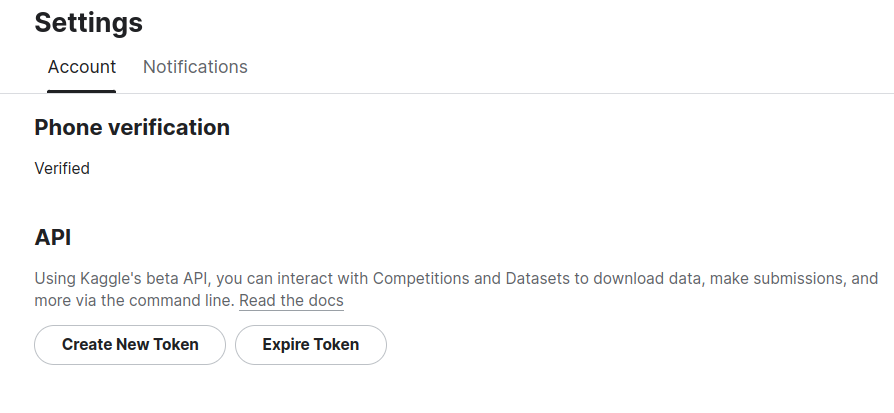

Next we need to upload the kaggle.json to google drive or directly to colab and use it to authenticate in kaggle servers.

In [ ]:
!mkdir ~/.kaggle
!cp /content/drive/MyDrive/kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

Now kaggle has been setup in google colab now we can download any kaggle dataset. The preprocessed dataset for RCNN can be found at this [link](https://www.kaggle.com/datasets/tarunbisht11/rcnn-processed-pickle)

In [ ]:
!kaggle datasets download -d tarunbisht11/rcnn-processed-pickle

In [ ]:
max_iou_threshold = 0.7
max_boxes = 50
max_selections = 1000
processed_data_save_path_train = "rcnn-processed-pickle/rcnn_train/rcnn_train"
processed_data_save_path_val = "rcnn-processed-pickle/rcnn_val/rcnn_val"
os.makedirs(processed_data_save_path_train, exist_ok=True)
os.makedirs(processed_data_save_path_val, exist_ok=True)

In [ ]:
all_images = []
all_labels = []
count = 0
if len(os.listdir(processed_data_save_path_train)) < 80000:
    for image, annot in tqdm(voc_dataset_train):
        image = np.array(image)
        boxes_annots = annot["annotation"]["object"]
        ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
        ss.setBaseImage(image)
        ss.switchToSelectiveSearchFast()
        rects = ss.process()[:max_selections]
        rects = np.array([[x, y, x+w, y+h] for x, y, w, h in rects])
        images, classes = process_data_for_rcnn(image,
                                                rects,
                                                label_2_idx,
                                                boxes_annots,
                                                max_iou_threshold,
                                                max_boxes)
        count += 1
        all_images += images
        all_labels += classes

    # saving processed data to pickle file
    for idx, (image, label) in enumerate(zip(all_images, all_labels)):
        with open(os.path.join(processed_data_save_path_train, f"img_{idx}.pkl"), "wb") as pkl:
            pickle.dump({"image": image, "label": label}, pkl)
else:
    print("Data Already Prepared.")

Data Already Prepared.


In [ ]:
all_images = []
all_labels = []
count = 0
if len(os.listdir(processed_data_save_path_val)) < 80000:
    for image, annot in tqdm(voc_dataset_val):
        image = np.array(image)
        boxes_annots = annot["annotation"]["object"]
        ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
        ss.setBaseImage(image)
        ss.switchToSelectiveSearchFast()
        rects = ss.process()[:max_selections]
        rects = np.array([[x, y, x+w, y+h] for x, y, w, h in rects])
        images, classes = process_data_for_rcnn(image,
                                                rects,
                                                label_2_idx,
                                                boxes_annots,
                                                max_iou_threshold,
                                                max_boxes)
        count += 1
        all_images += images
        all_labels += classes

    # saving processed data to pickle file
    for idx, (image, label) in enumerate(zip(all_images, all_labels)):
        with open(os.path.join(processed_data_save_path_val, f"img_{idx}.pkl"), "wb") as pkl:
            pickle.dump({"image": image, "label": label}, pkl)
else:
    print("Data Already Prepared.")

Data Already Prepared.


### Exercise ToDo
Make the above piece of code run parallely using Joblib. Joblib module in Python is used to execute tasks parallelly using Pipelines rather than executing them sequentially one after another.

#### Creating PyTorch dataset

We use `torch.utils.data.Dataset` to create dataset. This class takes processed data folder generated using above methods.

In [ ]:
class RCNNDataset(torch.utils.data.Dataset):
    def __init__(self, processed_data_folder, section_dim=(224, 224)):
        self.section_dim = section_dim
        self.data_files = os.listdir(processed_data_folder)
        self.data_files = list(map(lambda x: os.path.join(processed_data_folder, x), self.data_files))
        self.preprocess = torchvision.transforms.Normalize([0.485, 0.456, 0.406],
                                                           [0.229, 0.224, 0.225])

    def __len__(self):
        return len(self.data_files)

    def __getitem__(self, idx):
        with open(self.data_files[idx], "rb") as pkl:
            data = pickle.load(pkl)
        image, label = data["image"], data["label"]
        image = cv2.resize(image, self.section_dim)
        image = np.asarray(image, dtype=np.float32)
        image = torch.from_numpy(image)
        image = torch.permute(image, (2, 0, 1))
        image = self.preprocess(image)
        label = torch.tensor(label)
        return image, label

To visualize batches of data we have defined `imshow` function that takes batch of images and labels as inputs and plot them in a grid.

In [ ]:
def imshow(inp, labels, num_rows=16, num_cols=4):
    """Display image for Tensor."""
    fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(15, 30))
    axes = axes.ravel()
    mean = torch.tensor([0.485, 0.456, 0.406]).reshape(1, -1, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).reshape(1, -1, 1, 1)
    inp = std * inp + mean
    inp = inp.permute((0, 2, 3, 1))
    inp = inp.type(torch.uint8)
    for idx, ax in enumerate(axes):
        ax.imshow(inp[idx])
        ax.set_title(labels[idx])
        ax.grid(False)
        ax.set_axis_off()
    plt.show()

In [ ]:
train_dataset = RCNNDataset(processed_data_folder=processed_data_save_path_train, section_dim=(224, 224))
val_dataset = RCNNDataset(processed_data_folder=processed_data_save_path_val, section_dim=(224, 224))

In [ ]:
print("Train Dataset one sample images shape: ", train_dataset[0][0].shape)
print("Train Dataset one sample labels shape: ", train_dataset[0][1].shape)
print("Train Dataset one sample images dtype: ", train_dataset[0][0].dtype)
print("Train Dataset one sample labels dtype: ", train_dataset[0][1].dtype)
print("Train Dataset number of samples: ", len(train_dataset))

Train Dataset one sample images shape:  torch.Size([3, 224, 224])
Train Dataset one sample labels shape:  torch.Size([])
Train Dataset one sample images dtype:  torch.float32
Train Dataset one sample labels dtype:  torch.int64
Train Dataset number of samples:  80217


In [ ]:
print("Val Dataset one sample images shape: ", val_dataset[0][0].shape)
print("Val Dataset one sample labels shape: ", val_dataset[0][1].shape)
print("Val Dataset one sample images dtype: ", val_dataset[0][0].dtype)
print("Val Dataset one sample labels dtype: ", val_dataset[0][1].dtype)
print("Val Dataset number of samples: ", len(val_dataset))

Val Dataset one sample images shape:  torch.Size([3, 224, 224])
Val Dataset one sample labels shape:  torch.Size([])
Val Dataset one sample images dtype:  torch.float32
Val Dataset one sample labels dtype:  torch.int64
Val Dataset number of samples:  80139


Next we have defined torch dataloader for training the model using `torch.utils.data.DataLoader`

In [ ]:
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = torch.utils.data.DataLoader(val_dataset, batch_size=64, shuffle=False)

Train Batch


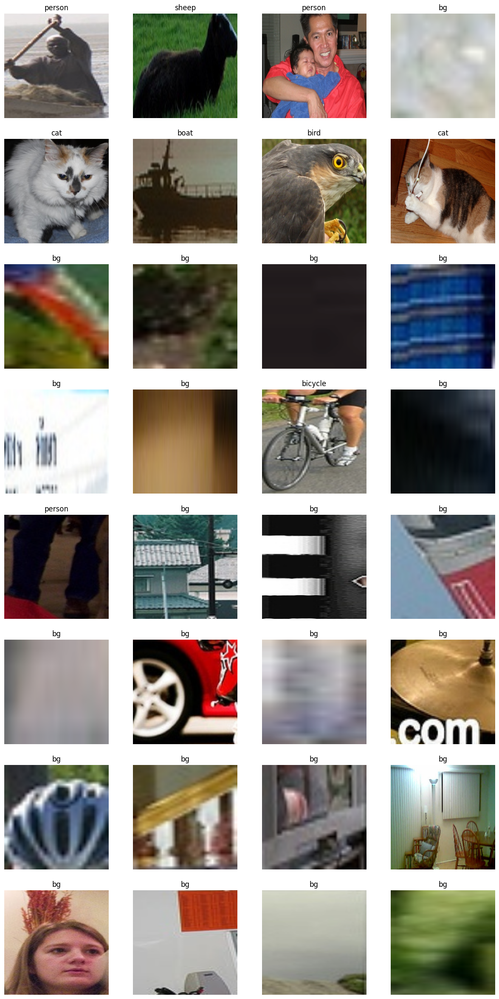

In [ ]:
inputs, labels = next(iter(train_loader))
labels = [idx_2_label[x.item()] for x in labels]
print("Train Batch")
imshow(inputs, labels, num_rows=8, num_cols=4)

Validation Batch


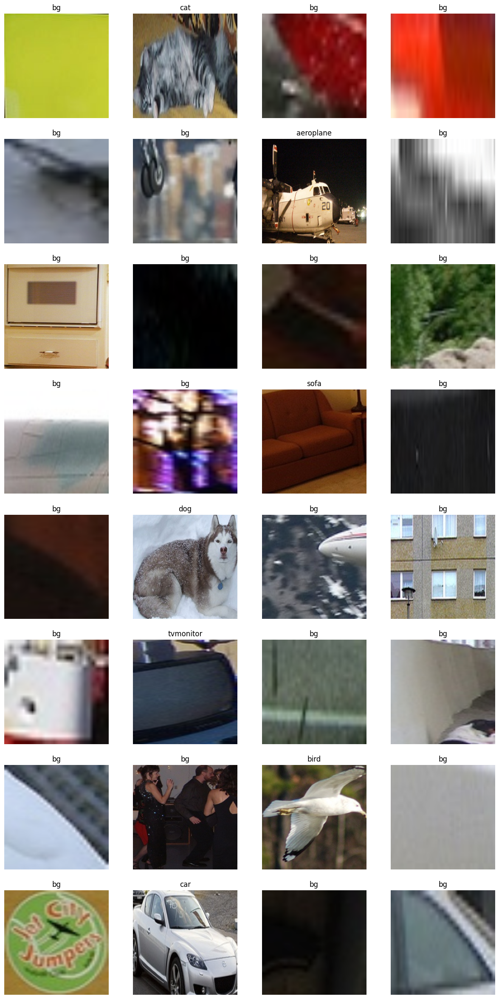

In [ ]:
inputs, labels = next(iter(val_loader))
labels = [idx_2_label[x.item()] for x in labels]
print("Validation Batch")
imshow(inputs, labels, num_rows=8, num_cols=4)

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Using Device: ", device)

Using Device:  cuda


## Training

### Defining model

We defined a function `build_model` that takes any resnet architecture defined in `torchvision` library and build a model based on number of classes in dataset.

In [ ]:
def build_model(backbone, num_classes):
    num_ftrs = backbone.fc.in_features
    # num_classes = number of class categories and +1 for background class
    backbone.fc = nn.Sequential(nn.Dropout(0.2),
                                nn.Linear(num_ftrs, 512),
                                nn.Dropout(0.2),
                                nn.Linear(512, num_classes+1))
    return backbone

We are loading `resent50` with pretrained checkpoints which was trained on imagenet. We are also freezing the whole resnet architecture so we will only train the classifier part.

In [ ]:
resnet_backbone = torchvision.models.resnet50(weights='IMAGENET1K_V2')
# freeze pretrained backbone
for param in resnet_backbone.parameters():
    param.requires_grad = False
model = build_model(backbone=resnet_backbone, num_classes=len(unique_class_labels))
model.to(device)

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 215MB/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

We have defined class_weights this gives more weightage to classes in dataset and give lower weightage to background class. Then we define cross entropy loss and adam optimizer for training.

In [ ]:
class_weights = [1.0]+[2.0]*len(unique_class_labels) # 1 for bg and 2 for other classes
class_weights = torch.tensor(class_weights).to(device)
criterion = nn.CrossEntropyLoss(weight=class_weights)
optimizer = optim.Adam(model.parameters(), lr=1e-4)

### Training the model

In [ ]:
torch.cuda.empty_cache()
num_epochs = 100
best_val_loss = 1000
epoch_train_losses = []
epoch_val_losses = []
train_accuracy = []
val_accuracy = []
count = 0
for idx in range(num_epochs):
    train_losses = []
    total_train = 0
    correct_train = 0
    model.train()
    for images, labels in tqdm(train_loader):
        optimizer.zero_grad()
        images = images.to(device)
        labels = labels.to(device)
        pred = model(images)
        loss = criterion(pred, labels)
        predicted = torch.argmax(pred, 1)
        total_train += labels.shape[0]
        correct_train += (predicted == labels).sum().item()
        loss.backward()
        optimizer.step()
        train_losses.append(loss.item())
    accuracy_train = (100 * correct_train) / total_train
    train_accuracy.append(accuracy_train)
    epoch_train_loss = np.mean(train_losses)
    epoch_train_losses.append(epoch_train_loss)

    val_losses = []
    total_val = 0
    correct_val = 0
    model.eval()
    with torch.no_grad():
        for images, labels in tqdm(val_loader):
            images = images.to(device)
            labels = labels.to(device)
            pred = model(images)
            loss = criterion(pred, labels)
            val_losses.append(loss.item())
            predicted = torch.argmax(pred, 1)
            total_val += labels.shape[0]
            correct_val += (predicted == labels).sum().item()

    accuracy_val = (100 * correct_val) / total_val
    val_accuracy.append(accuracy_val)
    epoch_val_loss = np.mean(val_losses)
    epoch_val_losses.append(epoch_val_loss)

    print('\nEpoch: {}/{}, Train Loss: {:.8f}, Train Accuracy: {:.8f}, Val Loss: {:.8f}, Val Accuracy: {:.8f}'.format(idx + 1, num_epochs, epoch_train_loss, accuracy_train, epoch_val_loss, accuracy_val))


    if epoch_val_loss < best_val_loss:
        best_val_loss = epoch_val_loss
        print("Saving the model state dictionary for Epoch: {} with Validation loss: {:.8f}".format(idx + 1, epoch_val_loss))
        torch.save(model.state_dict(), "rcnn_model.pt")
        count = 0
    else:
        count += 1

    if count == 5:
        break

100%|██████████| 1253/1253 [15:33<00:00,  1.34it/s]



Epoch: 1/100, Train Loss: 0.64668946, Train Accuracy: 86.98405575, Val Loss: 0.45590416, Val Accuracy: 89.13887121
Saving the model state dictionary for Epoch: 1 with Validation loss: 0.45590416


100%|██████████| 1253/1253 [07:13<00:00,  2.89it/s]



Epoch: 2/100, Train Loss: 0.41645256, Train Accuracy: 89.96596731, Val Loss: 0.48327551, Val Accuracy: 89.27363706


100%|██████████| 1253/1253 [06:47<00:00,  3.08it/s]



Epoch: 3/100, Train Loss: 0.36805147, Train Accuracy: 90.77252951, Val Loss: 0.45782487, Val Accuracy: 89.73907835


100%|██████████| 1253/1253 [06:47<00:00,  3.08it/s]



Epoch: 4/100, Train Loss: 0.34133269, Train Accuracy: 91.15274817, Val Loss: 0.45103499, Val Accuracy: 89.39218109
Saving the model state dictionary for Epoch: 4 with Validation loss: 0.45103499


100%|██████████| 1253/1253 [06:56<00:00,  3.01it/s]



Epoch: 5/100, Train Loss: 0.32376182, Train Accuracy: 91.46315619, Val Loss: 0.60181320, Val Accuracy: 89.54067308


100%|██████████| 1253/1253 [07:29<00:00,  2.78it/s]



Epoch: 6/100, Train Loss: 0.31392360, Train Accuracy: 91.59779099, Val Loss: 0.48469237, Val Accuracy: 89.81020477


100%|██████████| 1253/1253 [07:38<00:00,  2.73it/s]



Epoch: 7/100, Train Loss: 0.29900573, Train Accuracy: 91.90570577, Val Loss: 0.46181227, Val Accuracy: 90.14836721


100%|██████████| 1253/1253 [07:41<00:00,  2.71it/s]



Epoch: 8/100, Train Loss: 0.29431356, Train Accuracy: 92.06277971, Val Loss: 0.45976700, Val Accuracy: 89.70538689


100%|██████████| 1253/1253 [07:27<00:00,  2.80it/s]


Epoch: 9/100, Train Loss: 0.28652644, Train Accuracy: 92.23481307, Val Loss: 0.47067098, Val Accuracy: 90.02982318


## Inference

Next, we have defined some helper functions for inference. `process_inputs` - process input image and return box proposals and image as pytorch tensors.

In [ ]:
normalized_transform = torchvision.transforms.Normalize([0.485, 0.456, 0.406],
                                                        [0.229, 0.224, 0.225])
def process_inputs(image, max_selections=300, section_size=(224, 224)):
    images = []
    boxes = []
    ss = cv2.ximgproc.segmentation.createSelectiveSearchSegmentation()
    ss.setBaseImage(image)
    ss.switchToSelectiveSearchQuality()
    rects = ss.process()[:max_selections]
    rects = np.array([[x, y, x+w, y+h] for x, y, w, h in rects])
    for rect in rects:
        x1, y1, x2, y2 = rect
        img_section = image[y1: y2, x1: x2]
        img_section = cv2.resize(img_section, section_size)
        images.append(img_section)
        boxes.append(rect)
    images = np.array(images, dtype=np.float32)
    images = torch.from_numpy(images)
    images = images.permute(0, 3, 1, 2)
    images = normalized_transform(images)
    return images, np.array(boxes)

#### Non Max Supression

Non Maximum Suppression is a computer vision method that selects a single  bounding boxes from many overlapping bounding boxes in object detection. The criteria is usually discarding entities that are below a given probability bound.

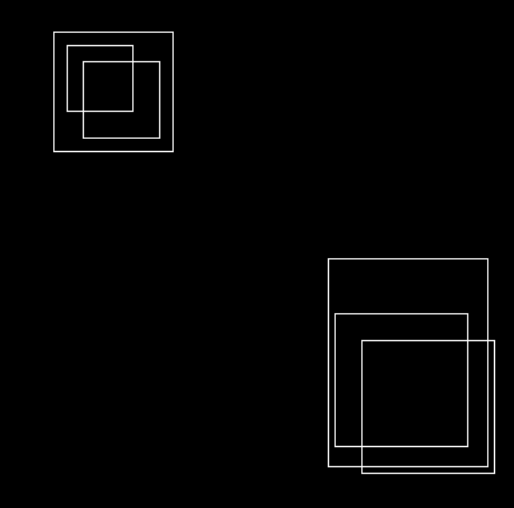

Reference: https://paperswithcode.com/method/non-maximum-suppression

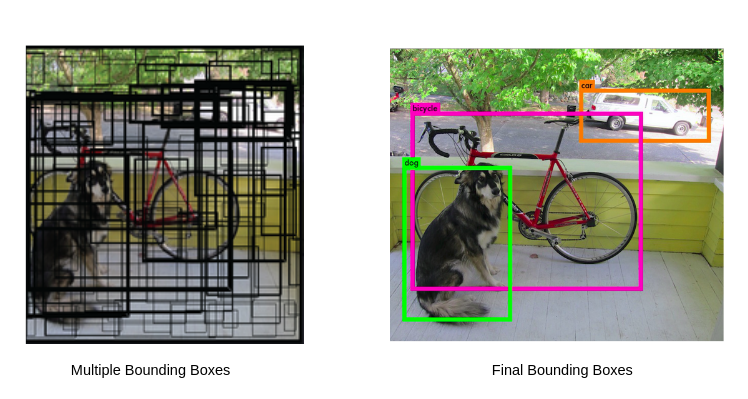



Reference: https://pjreddie.com/darknet/yolov1/

In [ ]:
def non_max_supression(boxes, scores, labels, threshold=0.5, iou_threshold=0.5):
    idxs = np.where(scores>threshold)
    boxes = boxes[idxs]
    scores = scores[idxs]
    labels = labels[idxs]
    idxs = np.argsort(scores)
    chossen_boxes = []
    choosen_boxes_scores = []
    choosen_boxes_labels = []
    while len(idxs):
        last = len(idxs) - 1
        choosen_idx = idxs[last]
        choosen_box = boxes[choosen_idx]
        choosen_box_score = scores[choosen_idx]
        choosen_box_label = labels[choosen_idx]
        chossen_boxes.append(choosen_box)
        choosen_boxes_scores.append(choosen_box_score)
        choosen_boxes_labels.append(choosen_box_label)
        idxs = np.delete(idxs, last)
        i = len(idxs)-1
        while i >= 0:
            idx = idxs[i]
            curr_box = boxes[idx]
            curr_box_score = scores[idx]
            curr_box_label = labels[idx]
            if (curr_box_label == choosen_box_label and
                calculate_iou_score(curr_box, choosen_box) > iou_threshold):
                idxs = np.delete(idxs, i)
            i -= 1
    return chossen_boxes, choosen_boxes_scores, choosen_boxes_labels

In [ ]:
def process_outputs(scores, boxes, threshold=0.5, iou_threshold=0.5):
    labels = np.argmax(scores, axis=1)
    probas = np.max(scores, axis=1)
    idxs = labels != 0
    boxes = boxes[idxs]
    probas = probas[idxs]
    labels = labels[idxs]
    assert len(probas) == len(boxes) == len(labels)
    final_boxes, final_boxes_scores, final_boxes_labels = non_max_supression(boxes, probas, labels, threshold, iou_threshold)
    return final_boxes, final_boxes_scores, final_boxes_labels

Next we load best model checkpoints.

In [ ]:
# loading best model
model.load_state_dict(torch.load("rcnn_model.pt"))

<All keys matched successfully>

In [ ]:
val_image = np.array(voc_dataset_val[0][0])
# preprocess input image
prep_val_images, prep_val_boxes = process_inputs(val_image)
prep_val_images.shape, prep_val_images.dtype, prep_val_boxes.shape, prep_val_boxes.dtype

(torch.Size([300, 3, 224, 224]), torch.float32, (300, 4), dtype('int32'))

In [ ]:
model.eval()
with torch.no_grad():
    output = model(prep_val_images.to(device))
# postprocess output from model
scores = torch.softmax(output, dim=1).cpu().numpy()
boxes, boxes_scores, boxes_labels = process_outputs(scores, prep_val_boxes, threshold=0.5, iou_threshold=0.5)

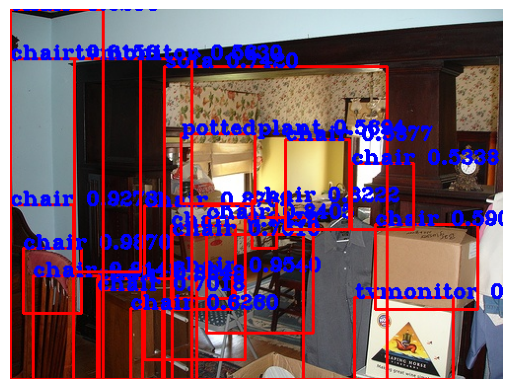

In [ ]:
final_image = draw_boxes(val_image,
                         boxes,
                         boxes_scores,
                         boxes_labels,
                         idx_2_label)
plt.axis("off")
plt.imshow(final_image)
plt.show()

In [ ]:
def predict(image, only_boxed_image=False, label_map=None, max_boxes=100, threshold=0.5, iou_threshold=0.5):
    # preprocess input image
    prep_val_images, prep_val_boxes = process_inputs(image, max_selections=max_boxes)
    model.eval()
    with torch.no_grad():
        output = model(prep_val_images.to(device))
    # postprocess output from model
    scores = torch.softmax(output, dim=1).cpu().numpy()
    boxes, boxes_scores, boxes_labels = process_outputs(scores,
                                                        prep_val_boxes,
                                                        threshold=threshold,
                                                        iou_threshold=iou_threshold)
    if only_boxed_image:
        box_image = draw_boxes(image, boxes, boxes_scores, boxes_labels, label_map)
        return box_image
    return boxes, boxes_scores, boxes_labels

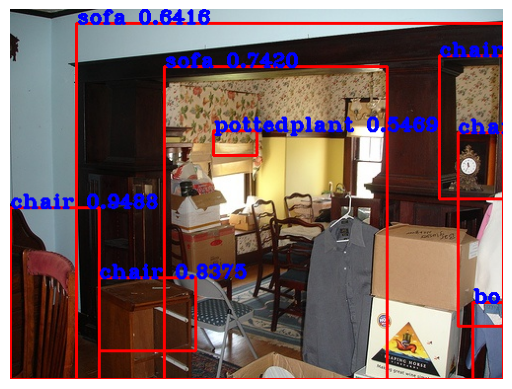

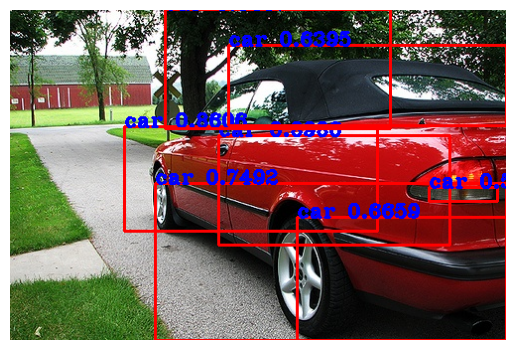

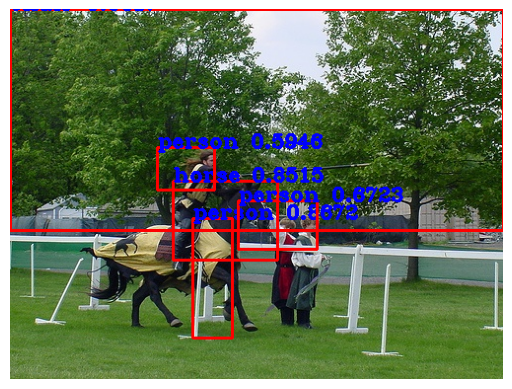

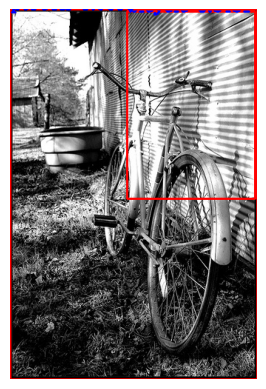

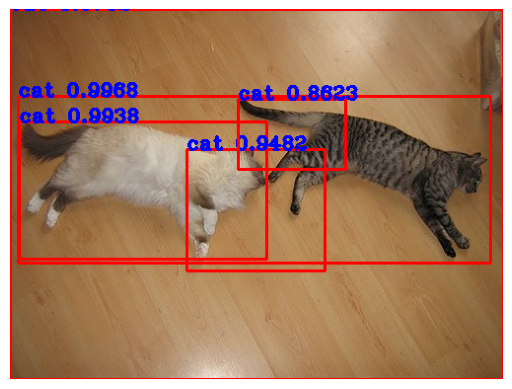

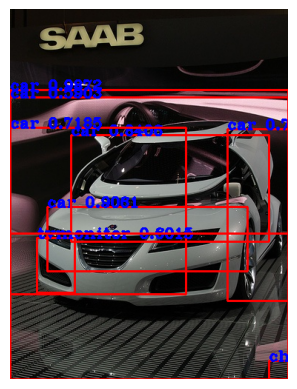

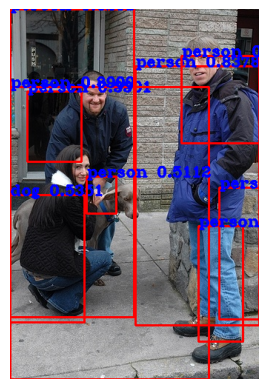

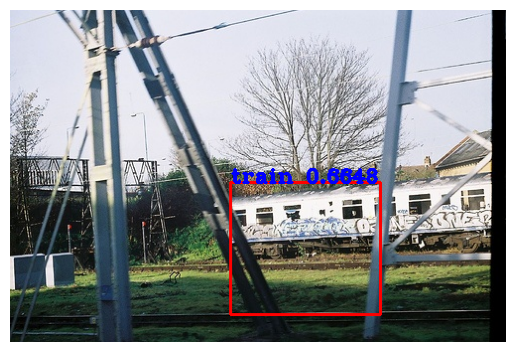

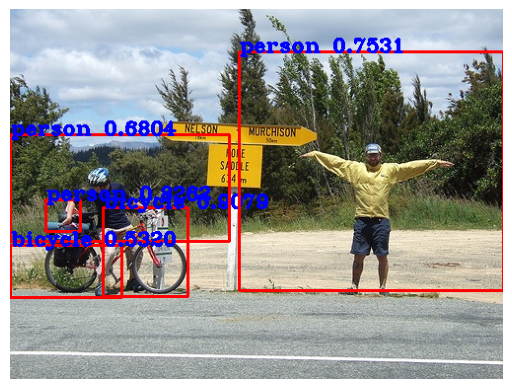

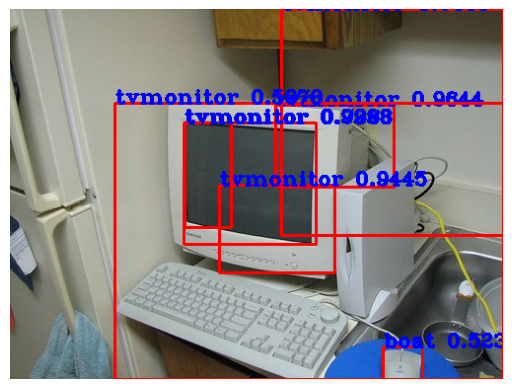

In [ ]:
for i in range(10):
    image = np.array(voc_dataset_val[i][0])
    final_image = predict(image, only_boxed_image=True,
                          label_map=idx_2_label,
                          threshold=0.5, iou_threshold=0.5)
    plt.axis("off")
    plt.imshow(final_image)
    plt.show()

# Exercise ToDo
How we can postprocess these outputs more better?